# Downloading and Evaluating Open Images

Downloading Google's [Open Images dataset](https://storage.googleapis.com/openimages/web/download.html) is now easier than ever with the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html#dataset-zoo-open-images-v7)! You can load all three splits of Open Images V7, including image-level labels, detections, segmentations, visual relationships, and point labels.

FiftyOne also natively supports [Open Images-style evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation), so you can easily evaluate your object detection models and explore the results directly in the library.

This walkthrough covers:

- Downloading [Open Images](https://storage.googleapis.com/openimages/web/index.html) from the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html)
- Computing predictions using a model from the [FiftyOne Model Zoo](https://voxel51.com/docs/fiftyone/user_guide/model_zoo/index.html)
- Performing [Open Images-style evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation) in FiftyOne to evaluate a model and compute its mAP
- Exploring the dataset and [evaluation results](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html)
- [Visualizing embeddings](https://voxel51.com/docs/fiftyone/user_guide/brain.html#visualizing-embeddings) through [interactive plots](https://voxel51.com/docs/fiftyone/user_guide/plots.html)

**So, what's the takeaway?**

Starting a new ML project takes data and time, and the datasets in the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html) can help jump start the development process.

Open Images in particular is one of the largest publicly available datasets for object detections, classification, segmentation, and more. Additionally, with [Open Images evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation) available natively in FiftyOne, you can quickly evaluate your models and compute mAP and PR curves.

While metrics like mAP are often used to compare models, the best way to improve your model's performance isn't to look at aggregate metrics but instead to get hands-on with your evaluation and visualize how your model performs on individual samples. All of this is made easy with FiftyOne!

## Setup

If you haven't already, install FiftyOne:

In [1]:
!pip install fiftyone

In this tutorial, we’ll use some [TensorFlow models](https://github.com/tensorflow/models) and [PyTorch](https://pytorch.org/vision/stable/index.html) to generate predictions and embeddings, and we’ll use the [UMAP method](https://github.com/lmcinnes/umap) to reduce the dimensionality of embeddings, so we need to install the corresponding packages:

In [2]:
!pip install tensorflow torch torchvision umap-learn

This tutorial also includes some of FiftyOne's [interactive plotting capabilities](https://voxel51.com/docs/fiftyone/user_guide/plots.html).

The recommended way to work with FiftyOne’s interactive plots is in [Jupyter notebooks](https://jupyter.org/) or [JupyterLab](https://jupyterlab.readthedocs.io/en/stable/). In these environments, you can leverage the full power of plots by [attaching them to the FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/plots.html#attaching-plots) and bidirectionally interacting with the plots and the App to identify interesting subsets of your data.

To use interactive plots in Jupyter notebooks, ensure that you have the `ipywidgets` package installed:

In [3]:
!pip install 'ipywidgets>=8,<9'

If you’re working in JupyterLab, refer to [these instructions](https://voxel51.com/docs/fiftyone/user_guide/plots.html#working-in-notebooks) to get setup.


<div class="admonition note">
<p>Support for interactive plots in non-notebook contexts and <a class="reference external" href="https://colab.research.google.com">Google Colab</a> is coming soon! In the meantime, you can still use FiftyOne's plotting features in those environments, but you must manually call <code class="docutils literal notranslate"><span class="pre">plot.show()</span></code> to update the state of a plot to match the state of a connected session, and any callbacks that would normally be triggered in response to interacting with a plot will not be triggered.</p>
</div>

## Loading Open Images

In this section, we'll load various subsets of Open Images from the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html) and visualize them using FiftyOne.

Let's start by downloading a small sample of 100 randomly chosen images + annotations:

In [4]:
import fiftyone as fo
import fiftyone.zoo as foz

In [5]:
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    max_samples=100,
    seed=51,
    shuffle=True,
)

Now let's launch the [FiftyOne App](https://voxel51.com/docs/fiftyone/user_guide/app.html) so we can explore the [dataset](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#datasets) we just downloaded.

Connected to FiftyOne on port 5151 at localhost.
If you are not connecting to a remote session, you may need to start a new session and specify a port



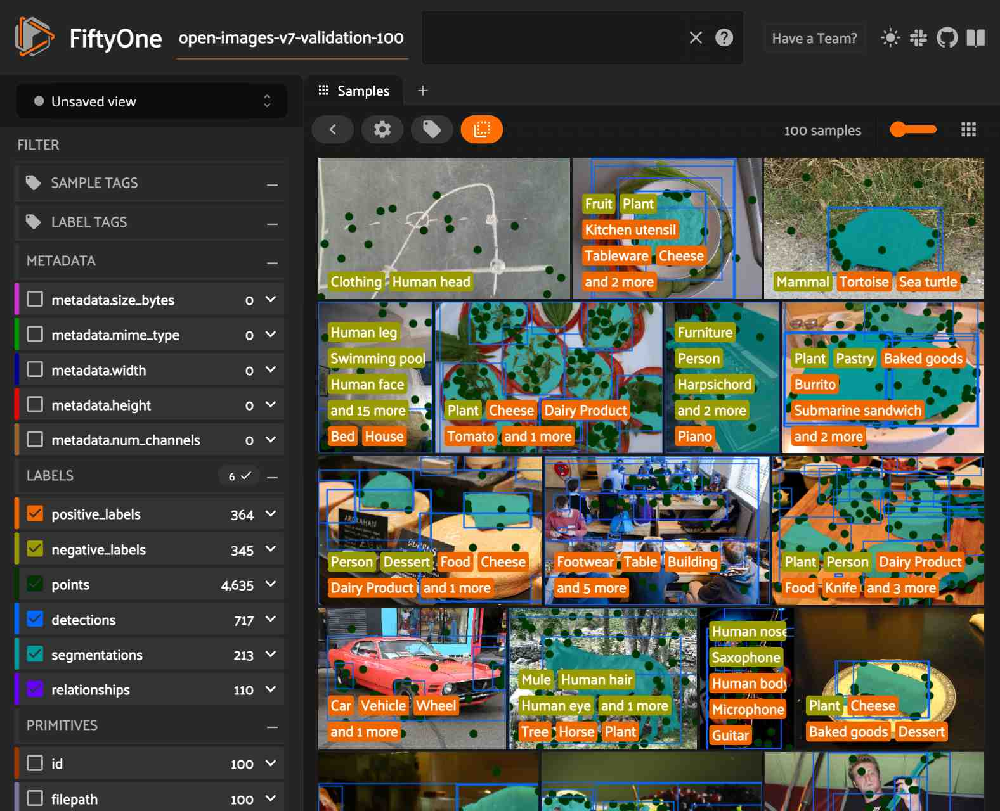

In [6]:
session = fo.launch_app(dataset.view())

Loading Open Images with FiftyOne also automatically stores relevant [labels](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#labels) and [metadata](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#metadata) like classes, attributes, and a class hierarchy that is used for evaluation in the dataset's `info` dictionary:

In [7]:
print(dataset.info.keys())

dict_keys(['hierarchy', 'attributes_map', 'attributes', 'segmentation_classes', 'point_classes', 'classes_map'])


When loading Open Images from the dataset zoo, there are a [variety of available parameters](https://voxel51.com/docs/fiftyone/api/fiftyone.zoo.datasets.base.html#fiftyone.zoo.datasets.base.OpenImagesV7Dataset) that you can pass to `load_zoo_dataset()` to specify a subset of the images and/or label types to download:

- `label_types` - a list of label types to load. The supported values are (`"detections", "classifications", "points", "segmentations", "relationships"`) for Open Images V7. Open Images v6 is the same except that it does not contain point labels. By default, all available labels types will be loaded. Specifying `[]` will load only the images
- `classes` - a list of classes of interest. If specified, only samples with at least one object, segmentation, or image-level label in the specified classes will be downloaded
- `attrs` - a list of attributes of interest. If specified, only download samples if they contain at least one attribute in `attrs` or one class in `classes` (only applicable when `label_types` contains `"relationships"`)
- `load_hierarchy` - whether to load the class hierarchy into `dataset.info["hierarchy"]`
- `image_ids` - an array of specific image IDs to download
- `image_ids_file` - a path to a `.txt`, `.csv`, or `.json` file containing image IDs to download

In addition, [like all other zoo datasets](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/datasets.html), you can specify:

- `max_samples` - the maximum number of samples to load
- `shuffle` - whether to randomly chose which samples to load if `max_samples` is given
- `seed` - a random seed to use when shuffling

Let's use some of these parameters to download a 100 sample subset of Open Images containing segmentations and image-level labels for the classes "Burrito", "Cheese", and "Popcorn".

In [8]:
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["segmentations", "classifications"],
    classes = ["Burrito", "Cheese", "Popcorn"],
    max_samples=100,
    seed=51,
    shuffle=True,
    dataset_name="open-images-food",
)

Only found 83 (<100) samples matching your requirements
Necessary images already downloaded
Existing download of split 'validation' is sufficient
Loading existing dataset 'open-images-food'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use



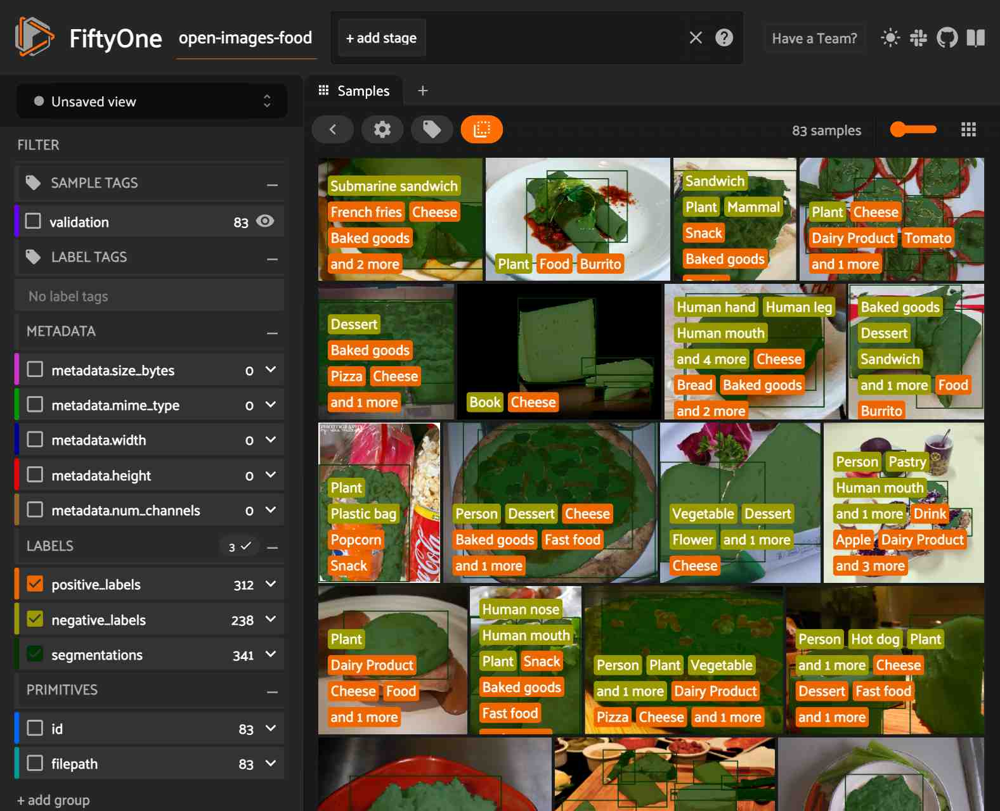

In [9]:
session.view = dataset.view()

In [10]:
session.freeze() # screenshots App for sharing

We can do the same for visual relationships. For example, we can download only samples that contain a relationship with the "Wooden" attribute.

In [ ]:
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["relationships"],
    attrs=["Wooden"],
    max_samples=100,
    seed=51,
    shuffle=True,
    dataset_name="open-images-relationships",
)

You can visualize relationships in the App by clicking on a sample to open the [App's expanded view](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-a-sample). From there, you can hover over objects to see their attributes in a tooltip.

Alternatively, you can use the settings menu in the lower-right corner of the media player to set `show_attributes` to True to make attributes appear as persistent boxes (as shown below). This can also be achieved programmatically by [configuring the App](https://voxel51.com/docs/fiftyone/user_guide/config.html#configuring-the-app):


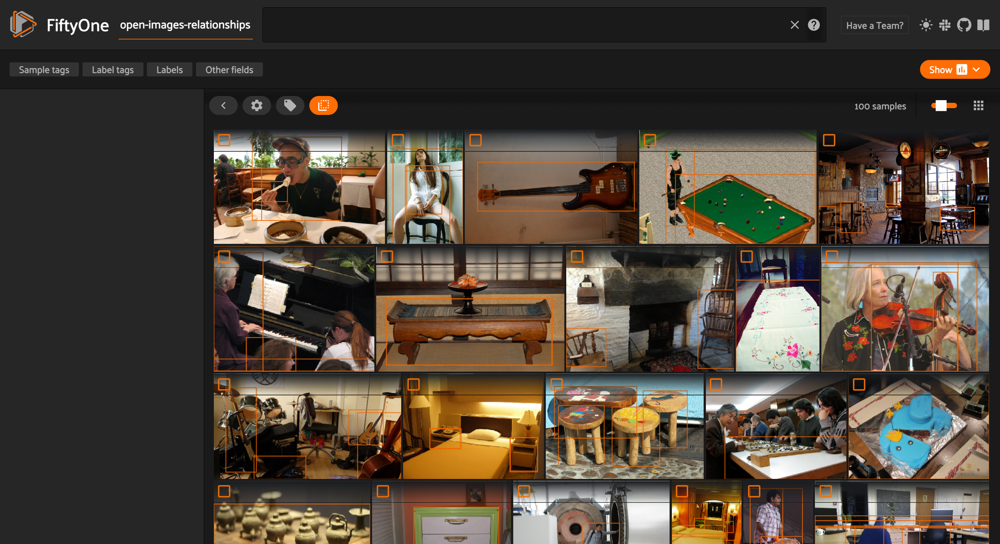

In [12]:
# Launch a new App instance with a customized config
app_config = fo.AppConfig()
app_config.show_attributes = True

session = fo.launch_app(dataset, config=app_config)

With Open Images V7, Google added point labels to the dataset, which are represented as `Keypoint` labels in FiftyOne. This means that we can select a dataset with points with ground truth point labels (potentially positive, negative, or mixed) for the classes `Tortoise` and `Sea turtle`:

In [ ]:
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["points"],
    classes = ["Tortoise", "Sea turtle"],
    seed=51,
    shuffle=True,
    dataset_name="open-images-point",
)


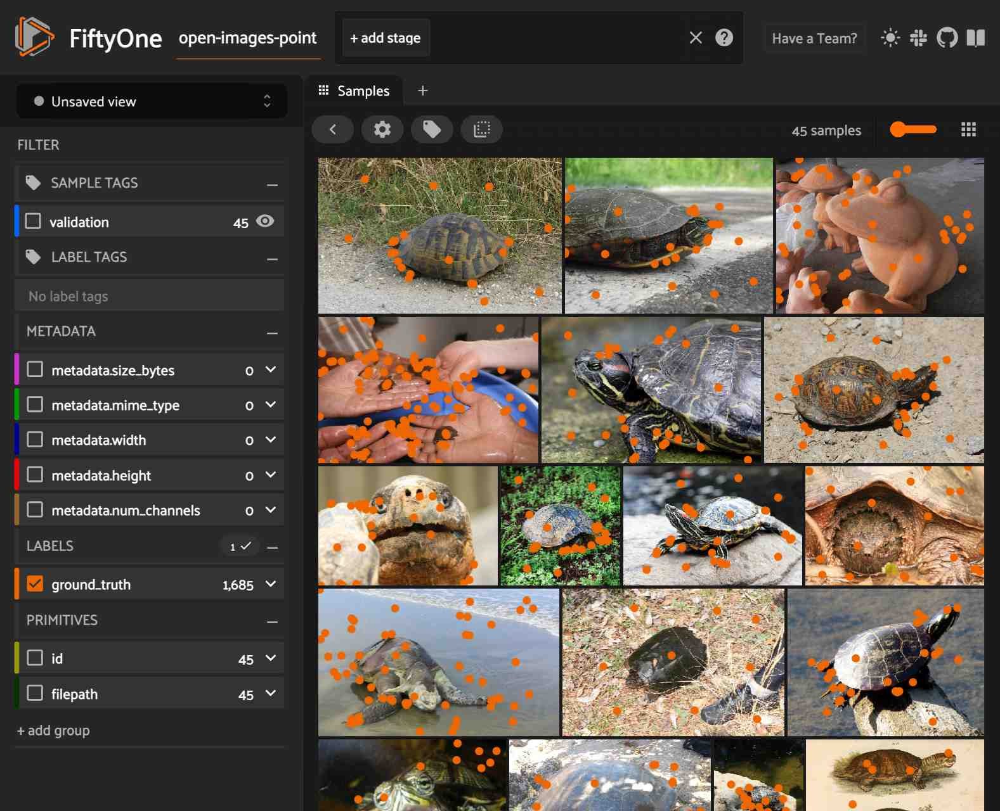

In [14]:
session.view = dataset.view()

In [15]:
session.freeze()

As we can see by inspecting the samples in the grid, some of the point labels have more votes than others, and there are different `source` values, denoting the various methods used to generated these point labels. For details, see the [Open Images V7 paper](https://arxiv.org/pdf/2210.14142v2.pdf). If we just want point labels that we are relatively sure are positive, we can filter the `Keypoints` for these using `filter_labels()`:

In [16]:
from fiftyone import ViewField as F
positive_dataset = dataset.filter_labels("points", F("estimated_yes_no") == "yes")


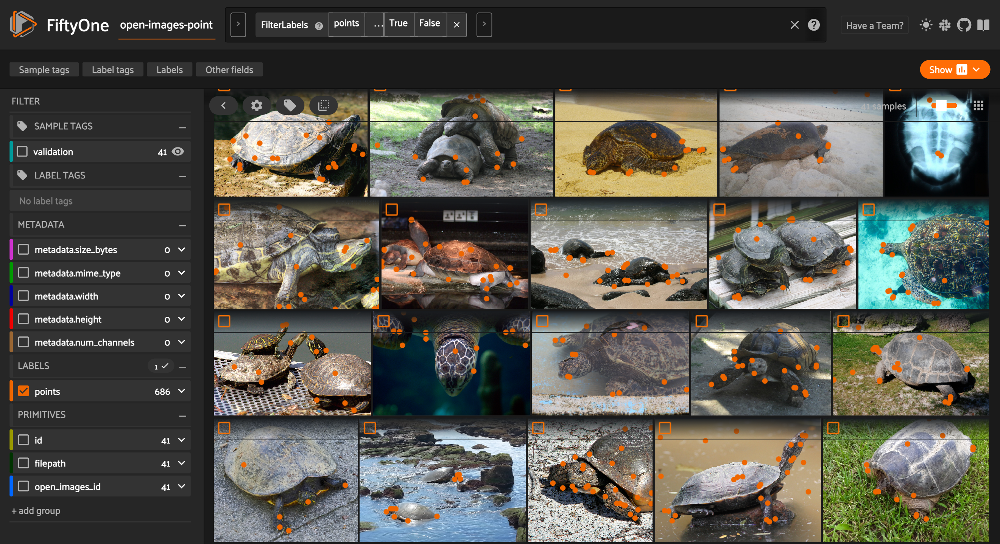

In [17]:
session.view = positive_dataset.view()

As a basis for the rest of this walkthrough, let's download a subset of Open Images containing dog and cat objects on which we can evaluate a model.

To ensure that we have exactly the same number of labels for each class, let's download two subsets, one for dogs and one for cats, and merge them together.

In [ ]:
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["detections", "classifications"],
    classes=["Cat"],
    max_samples=250,
    seed=51,
    shuffle=True,
    dataset_name="open-images-cat-dog",
)

dog_subset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["detections", "classifications"],
    classes=["Dog"],
    max_samples=250,
    seed=51,
    shuffle=True,
    dataset_name="dog-subset",
)

Now let's merge the samples together into one dataset:

In [19]:
# Merge the samples together into the same dataset
dataset.merge_samples(dog_subset)


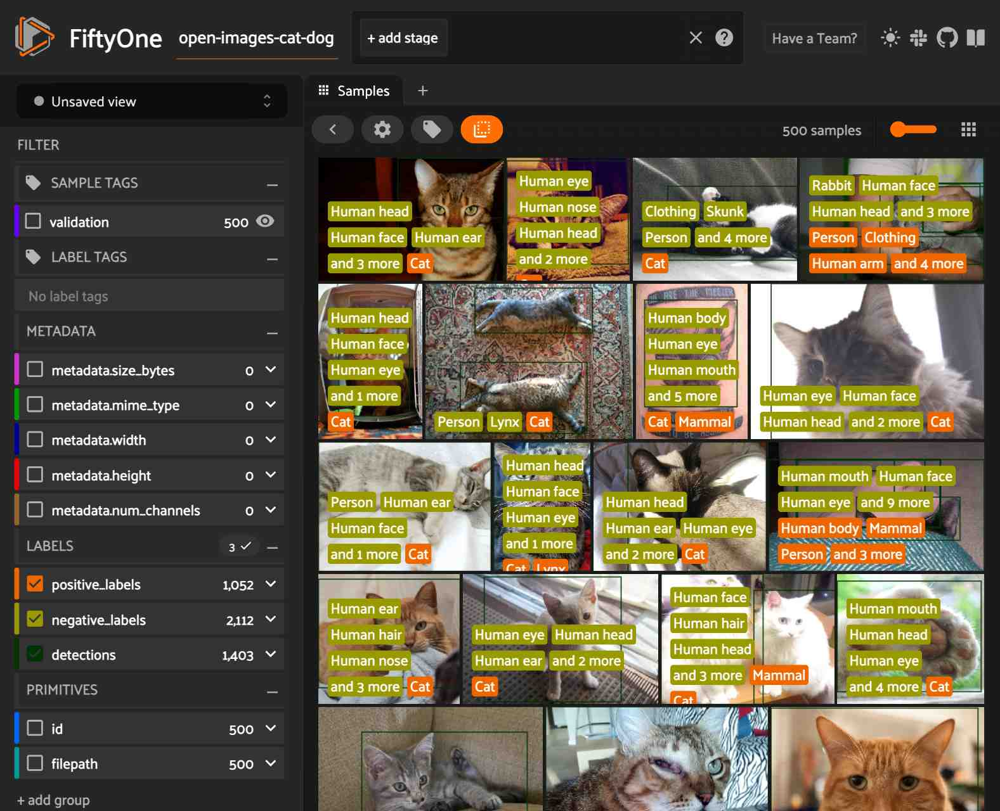

In [20]:
session.dataset = dataset

The FiftyOne App provides a [patches view](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-object-patches) that can be used to view every object in the dataset as an individual image. Just click the [patches icon](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-object-patches) and select the appropriate [detections field](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#object-detection):


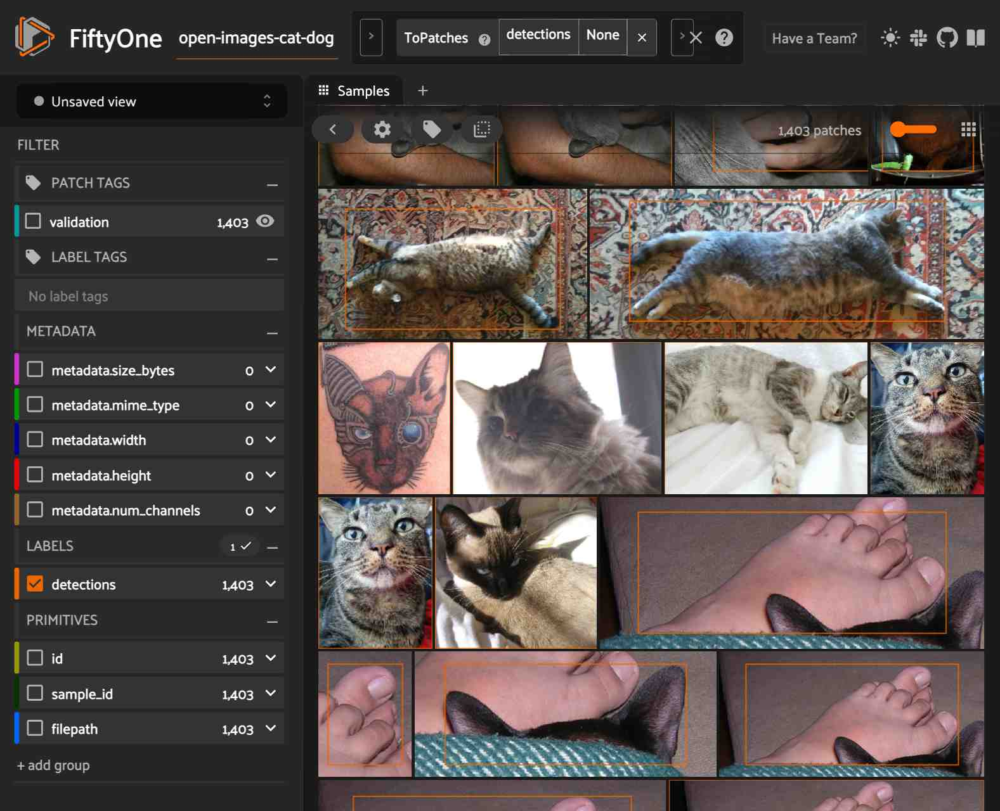

In [21]:
session.show()

In [22]:
session.freeze()  # screenshot for sharing

## Open Images-style evaluation

FiftyOne natively supports [Open Images detection evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation), so you can easily evaluate your object detection models and explore the results directly in FiftyOne.

This section produces object detection predictions from a model in the [FiftyOne Model Zoo](https://voxel51.com/docs/fiftyone/user_guide/model_zoo/index.html) and evaluates them with FiftyOne.

Evaluating in FiftyOne is much more flexible than [other evaluation APIs](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/evaluation_protocols.md), which produce only aggregate performance metrics. For example, FiftyOne evaluation also marks individual ground truth and predicted detections as either true positive, false positive, and false negative, allowing you to explore your model results and easily find failure modes of your model or even [annotation mistakes](https://voxel51.com/docs/fiftyone/user_guide/brain.html#label-mistakes).

### Generate predictions

The [FiftyOne Model Zoo](https://voxel51.com/docs/fiftyone/user_guide/model_zoo/index.html) does not (yet!) contain models trained on Open Images, so instead we'll use a model trained on [COCO](https://cocodataset.org/#home) and evaluate only classes that overlap between COCO and Open Images.

Note that, if you want to instead evaluate your own model predictions, [adding custom model predictions](https://voxel51.com/docs/fiftyone/recipes/adding_detections.html) to a FiftyOne dataset is very easy.

The model we are using requires [TensorFlow Models](https://github.com/tensorflow/models), which we can easily install using [ETA](https://github.com/voxel51/eta), a package bundled with FiftyOne:

In [23]:
!eta install models

Now let's load the model and run inference on our dataset using FiftyOne:

In [24]:
model = foz.load_zoo_model("ssd-mobilenet-v1-coco-tf")

In [25]:
dataset.apply_model(model, label_field="predictions", confidence_thresh=0.5)

 100% |█████████████████| 500/500 [48.9m elapsed, 0s remaining, 0.2 samples/s]    


The dataset contains ground truth objects and now model predictions in its `predictions` field. However, we are only interested in the classes "Cat" and "Dog" for this example, so we will [create a view](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) containing only the labels of interest.

Since we specified these classes when downloading the dataset, all images are guaranteed to be related to the classes "Cat" and "Dog", we just need to filter the individual labels.

In addition, there is a capitalization difference between the class names of Open Images ("Cat" and "Dog") and COCO ("cat" and "dog"), so we'll use FiftyOne to [normalize the labels](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#modifying-fields):

In [26]:
from fiftyone import ViewField as F

oi_classes = ["Dog", "Cat"]
coco_classes = ["dog", "cat"]

eval_view = (
    dataset
    .filter_labels("detections", F("label").is_in(oi_classes), only_matches=False)
    .filter_labels("predictions", F("label").is_in(coco_classes), only_matches=False)
    .map_labels("predictions", {"dog": "Dog", "cat": "Cat"})
)

To see a human-readable description of the view, just call print:

In [27]:
print(eval_view)

Dataset:     open-images-cat-dog
Media type:  image
Num samples: 500
Sample fields:
    id:              fiftyone.core.fields.ObjectIdField
    filepath:        fiftyone.core.fields.StringField
    tags:            fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:        fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    positive_labels: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classifications)
    negative_labels: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classifications)
    detections:      fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    predictions:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    eval_tp:         fiftyone.core.fields.IntField
    eval_fp:         fiftyone.core.fields.IntField
    eval_fn:         fiftyone.core.fields.IntField
View stages:
    1. FilterLabels(field='detections', filter={'$in':

### Running evaluation

We're now ready to evaluate the contents of `eval_view` in FiftyOne with one line of code. 

Before we do this, note that [Open Images evaluation](https://storage.googleapis.com/openimages/web/evaluation.html) provides a few additions on top of the evaluation protocol for [Pascal VOC 2010](http://host.robots.ox.ac.uk/pascal/VOC/voc2010/devkit_doc_08-May-2010.pdf):

- You can specify sample-level positive and negative labels; any object whose class is not in either list is ignored for that sample
- A [class hierarchy](https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy_visualizer/circle.html) can be used to expand ground truth or predicted classes
- Ground truth objects can use the `IsGroupOf` attribute to indicate multiple instances of a class existing within the bounding box

All of these are required when evaluating a model on Open Images to compute the official mAP used to compare models in challenges and in research papers. If you are developing a custom dataset, you can choose to incorporate any number of these features into your dataset schema and selectively activate them when evaluating in FiftyOne.

#### Open Images Challenge evaluation

FiftyOne's implementation of [Open Images-style evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation) matches the reference implementation from the [TF Object Detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/challenge_evaluation.md#object-detection-track), so you can use FiftyOne to compute the official mAP used for the [Open Images Challenge](https://storage.googleapis.com/openimages/web/evaluation.html).

In addition, by using FiftyOne, you'll also gain access to helpful sample- and label-level results like true positives, false positives, and false negatives that can be used to [evaluate and analyze your model performance](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html) across various slices of your dataset.

The method call below computes the official Open Images mAP for our model predictions, leveraging the required image-level labels and expanded hierarchies that were automatically populated when we loaded the dataset from the FiftyOne Dataset Zoo:

In [ ]:
results = eval_view.evaluate_detections(
    "predictions",
    gt_field="detections",
    method="open-images",
    pos_label_field="positive_labels",
    neg_label_field="negative_labels",
    hierarchy=dataset.info["hierarchy"],
    expand_pred_hierarchy=True,
)

The returned `results` object is an [OpenImagesDetectionResults](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.eval.openimages.html#fiftyone.utils.eval.openimages.OpenImagesDetectionResults) instance that provides methods like [mAP()](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.eval.openimages.html#fiftyone.utils.eval.openimages.OpenImagesDetectionResults.mAP), [plot_confusion_matrix()](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.eval.openimages.html#fiftyone.utils.eval.openimages.OpenImagesDetectionResults.plot_confusion_matrix) and [plot_pr_curves()](https://voxel51.com/docs/fiftyone/api/fiftyone.utils.eval.openimages.html#fiftyone.utils.eval.openimages.OpenImagesDetectionResults.plot_pr_curves) that you can use to view common evaluation metrics.

In [29]:
results.mAP()

0.7817133327903734

In [30]:
results.plot_confusion_matrix()

FigureWidget({
    'data': [{'mode': 'markers',
              'opacity': 0.1,
              'type': 'scatter',…

In [31]:
results.plot_pr_curves()

FigureWidget({
    'data': [{'customdata': array([1.        , 0.98868752, 0.98573655, 0.98535502, 0.98457229, …

#### Custom dataset evaluation

Using image-level labels in evaluation is useful to determine how well the model is able to detect specifically the objects that exist in the image.

However, in this walkthrough, we are interested in evaluating false positives where the model was confused about the class of an object. This is something that we would not get by only evaluating classes specified by image-level labels, since the model may predict a cat in an image where "Cat" was not an image-level label.

To perform this inter-class evaluation, we will set the parameter `classwise=False` and remove the image-level labels from the evaluation routine. Additionally, since our predictions are from a model trained without a class hierarchy, we will not expand the ground truth detections:

In [32]:
results = eval_view.evaluate_detections(
    "predictions",
    gt_field="detections",
    method="open-images",
    eval_key="eval",
    classwise=False,
    expand_gt_hierarchy=False,
)

Evaluating detections...
 100% |█████████████████| 500/500 [5.3s elapsed, 0s remaining, 103.9 samples/s]      


In [33]:
results.mAP()

0.7714961284473072

The slight drop in mAP is expected when matching predicted objects with ground truth of different classes, but this is desirable when trying to closely evaluate and understand your model. By default, when `classwise=True`, all false positives indicate that a predicted object was left unmatched. On the other hand, with `classwise=False`, some false positives now indicate that a prediction matched a ground truth object with a different class. This implies that the model was confident about the object being the incorrect class and that is information that we want to know.

### Analyzing the results

FiftyOne evaluation results also allow you to plot PR curves and [interactivley explore confusion matrices](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#confusion-matrices):

In [34]:
plot = results.plot_pr_curves()
plot.show()

FigureWidget({
    'data': [{'customdata': array([1.        , 0.98868752, 0.98573655, 0.98535502, 0.98457229, …

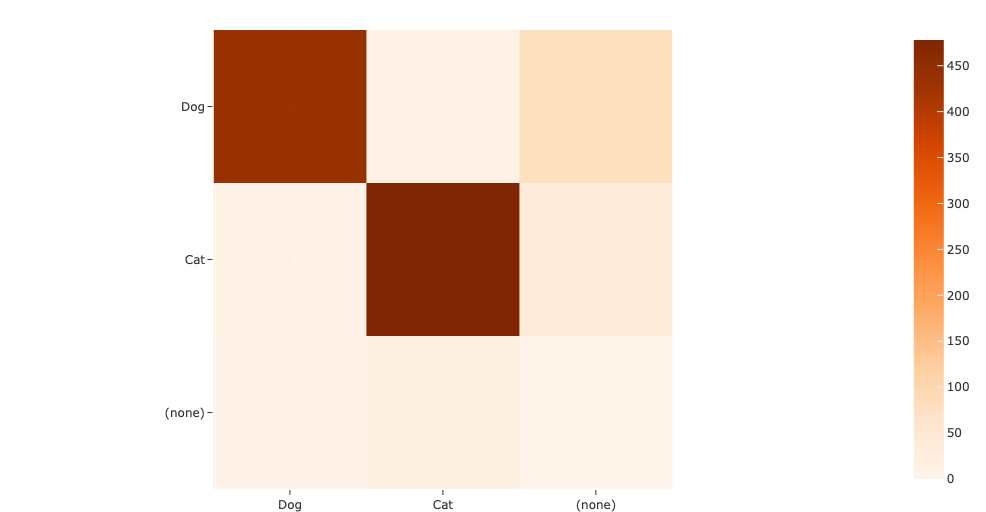

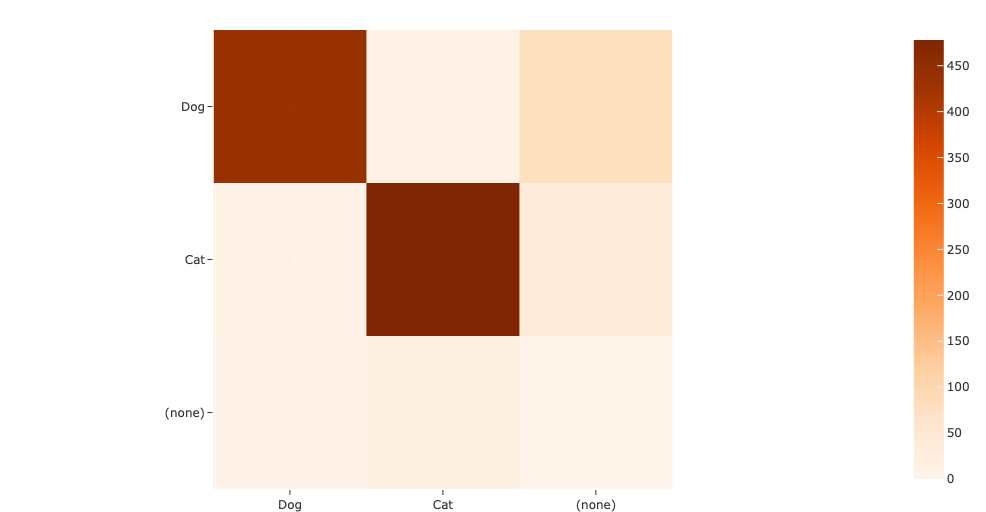

FigureWidget({
    'data': [{'mode': 'markers',
              'opacity': 0.1,
              'type': 'scatter',…

In [35]:
plot = results.plot_confusion_matrix(classes=["Dog", "Cat"])
plot.show(height=512)

Note that, since we decided to evaluate with `classwise=False`, the off-diagonal elements of the confusion matrix are populated with instances where the model prediction was matched with a ground truth of a different class.


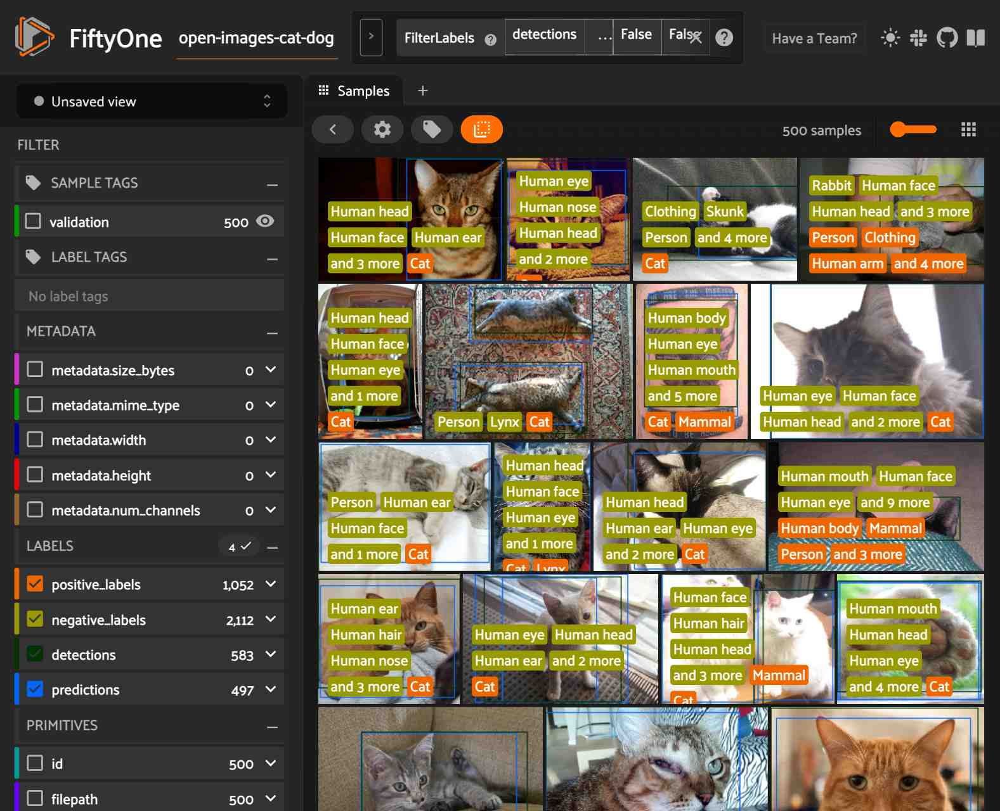

In [36]:
session.view=eval_view

In [37]:
session.freeze()


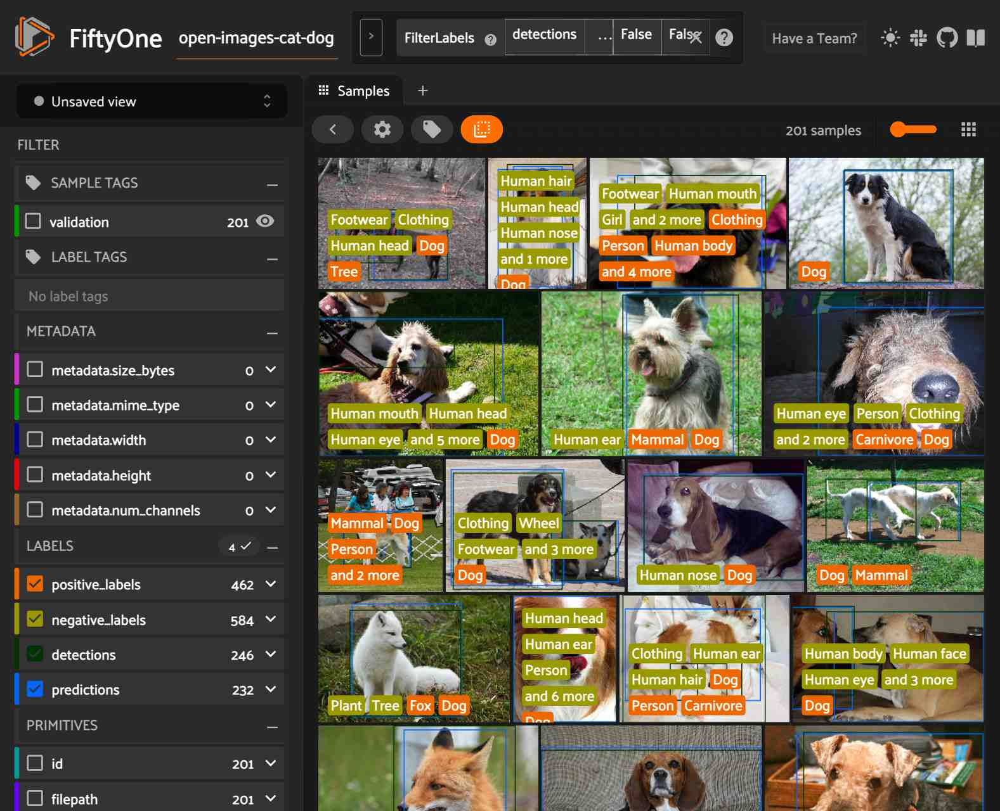

In [38]:
session.show()

In [39]:
# If you are in a Jupyter notebook, attach plot to session
session.plots.attach(plot)

In [40]:
plot.connect()
plot.show()

FigureWidget({
    'data': [{'mode': 'markers',
              'opacity': 0.1,
              'type': 'scatter',…

Thanks to the [interactive plotting in FiftyOne](https://voxel51.com/docs/fiftyone/user_guide/plots.html#attaching-plots), we can attach this plot to our `session` object so that when you [click a cell of the confusion matrix](https://voxel51.com/docs/fiftyone/user_guide/plots.html#confusion-matrices), the session will automatically update to show the relevant samples.

For example, if we click the top middle cell, the session will be updated to only show the examples where a dog was predicted as a cat.

**Note:** Interactive plotting is currently only available in Jupyter notebooks, but it will soon be available in all environments!

In [41]:
session.freeze()  # screenshot App and attached plots

When running [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections), specifying an `eval_key` stores true positive, false positive, and false negative labels on the relevant ground truth and predicted objects. It also stores the ID of the matched ground truth object and the IoU of the match under `<eval_key>_id` and `<eval_key>_iou`.

The `eval_key` in this example was set to `"eval"`:

In [42]:
print(eval_view.first().predictions.detections[0])

<Detection: {
    'id': '63ec56fed3964b0824a4dae9',
    'attributes': {},
    'tags': [],
    'label': 'Cat',
    'bounding_box': [
        0.4742983281612396,
        0.009991496801376343,
        0.5113846361637115,
        0.9810408651828766,
    ],
    'mask': None,
    'confidence': 0.8927010297775269,
    'index': None,
    'eval_iou': 0.8808952775,
    'eval_id': '63ec539ad3964b0824a4c724',
    'eval': 'tp',
}>


You can rerun [evaluate_detections()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.evaluate_detections) multiple times with different `eval_key` values to store multiple sets of evaluation runs on a dataset.

Previous evaluation runs can easily be [loaded, viewed, and deleted](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#managing-evaluations) at any time, including in future Python sessions.

## Advanced dataset exploration

FiftyOne allows you to easily explore any fields that you have on your dataset both through code by creating a [view](https://voxel51.com/docs/fiftyone/user_guide/using_views.html) and through the [App](https://voxel51.com/docs/fiftyone/user_guide/app.html).

For example, let's find all instances of `dog` or `cat` predictions with confidence >= 0.7 and sort the matching samples by number of true positives in the sample.

We can construct this view via the [App](https://voxel51.com/docs/fiftyone/user_guide/app.html), we just need to click "add stage", select `SortBy`, and enter the field `eval_tp` with `reverse=True`. Then click the down arrow next to the `predictions` field we want to [filter](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering), type in the labels we want to include (cat and dog), and adjust the confidence slider threshold to 0.7.


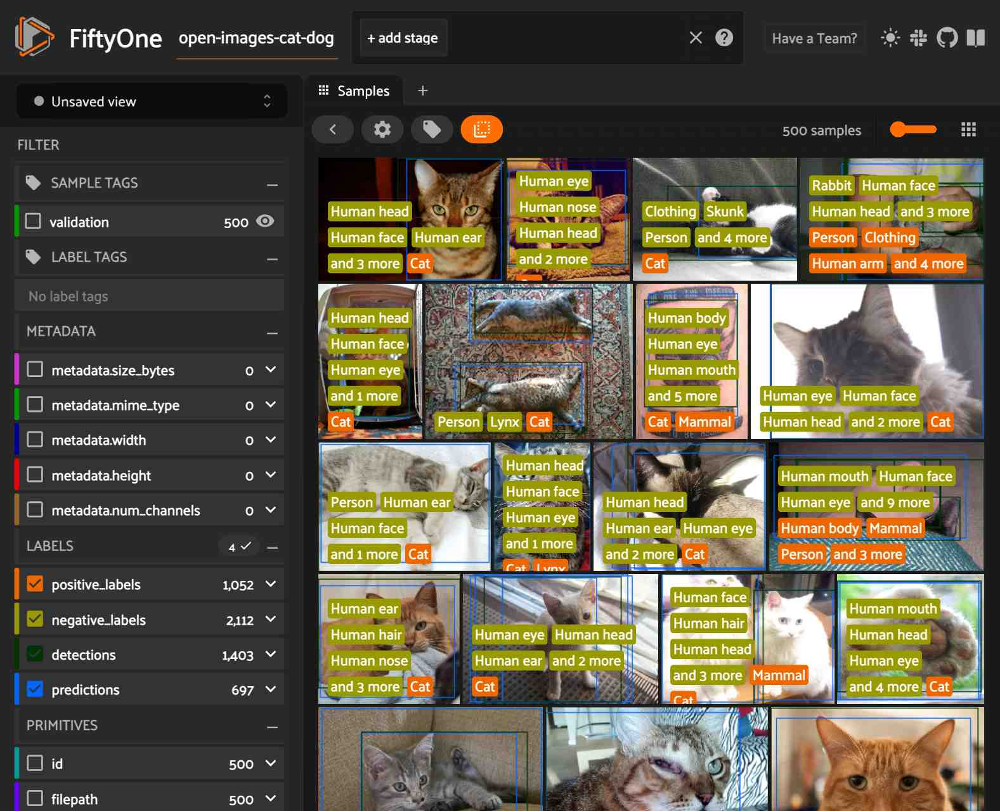

In [43]:
session = fo.launch_app(dataset)

We could also construct the same view [programmatically](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering):

In [44]:
from fiftyone import ViewField as F

dog_cat_view = (
    dataset
    .filter_labels(
        "predictions",
        (F("label").is_in(["dog", "cat"])) & (F("confidence") > 0.7),
    )
    .sort_by("eval_tp", reverse=True)
)

In [45]:
print(dog_cat_view)

Dataset:     open-images-cat-dog
Media type:  image
Num samples: 412
Sample fields:
    id:              fiftyone.core.fields.ObjectIdField
    filepath:        fiftyone.core.fields.StringField
    tags:            fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:        fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    positive_labels: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classifications)
    negative_labels: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Classifications)
    detections:      fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    predictions:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    eval_tp:         fiftyone.core.fields.IntField
    eval_fp:         fiftyone.core.fields.IntField
    eval_fn:         fiftyone.core.fields.IntField
View stages:
    1. FilterLabels(field='predictions', filter={'$and


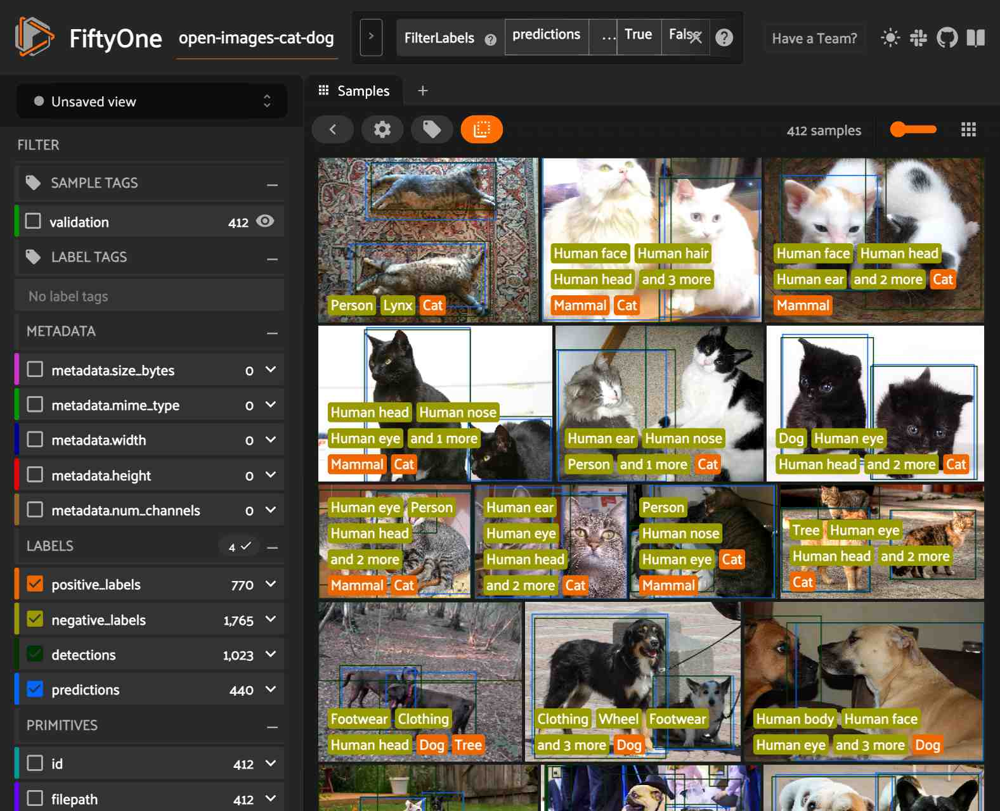

In [46]:
session.view = dog_cat_view

These views are easy to create but can be incredibly useful to explore and query your dataset and model predictions.

For example, we can find all high confidence predictions of "Dog" that ended up being false positives.

In [47]:
fp_dog_view = dataset.filter_labels(
    "predictions",
    (F("eval") == "fp") & (F("confidence") > 0.9),
)


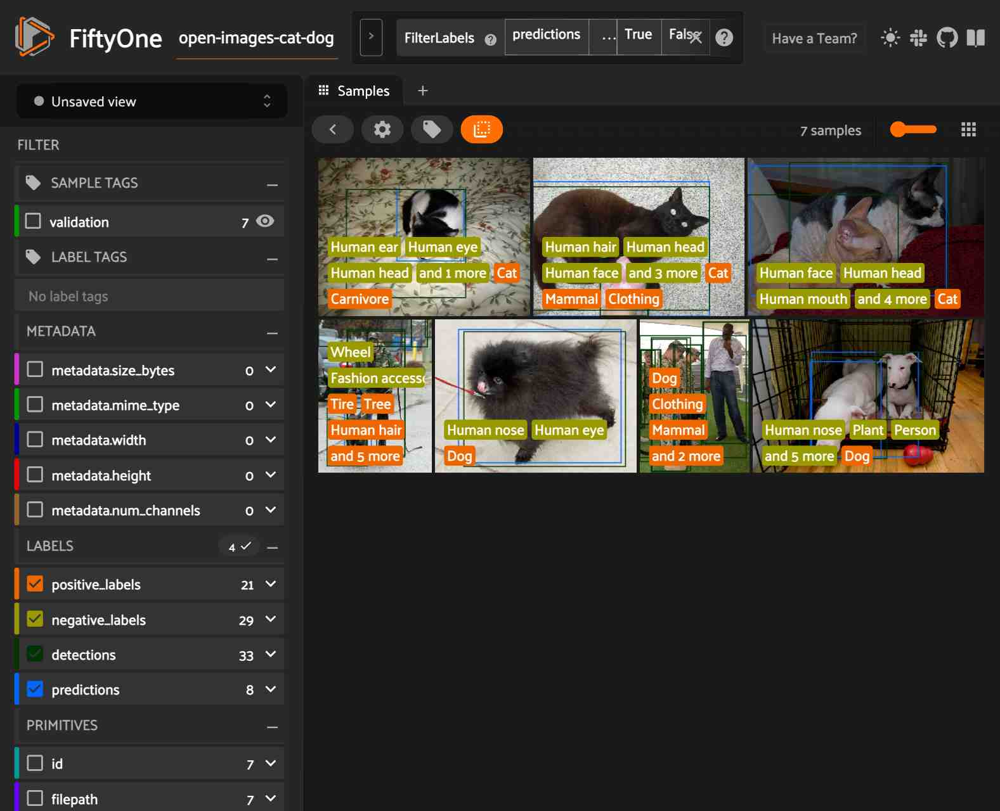

In [48]:
session.view = fp_dog_view

In [49]:
session.freeze()

Looking through some of these examples, we can see that when the model confuses dogs for cats roughly the same amount as cats for dogs. Additionally, the model occasionally has issues localizing bounding boxes resulting in unmatched detections due to an IoU lower than 0.5. 

In the example above, there are two ground truth "cat" boxes and one detected "dog" box containing both cats. This implies that we should look more closely at our training data to verify that there are no cats mistakenly annotated as dogs and that the boxes are localized properly.


The same workflow can be performed through the App using [evaluation views](https://voxel51.com/docs/fiftyone/user_guide/app.html#viewing-evaluation-patches). After evaluating detections and storing the results in an `eval_key`, you can click the following button in the App to open the evaluation view allowing you to explore individual TP/FP/FN patches.


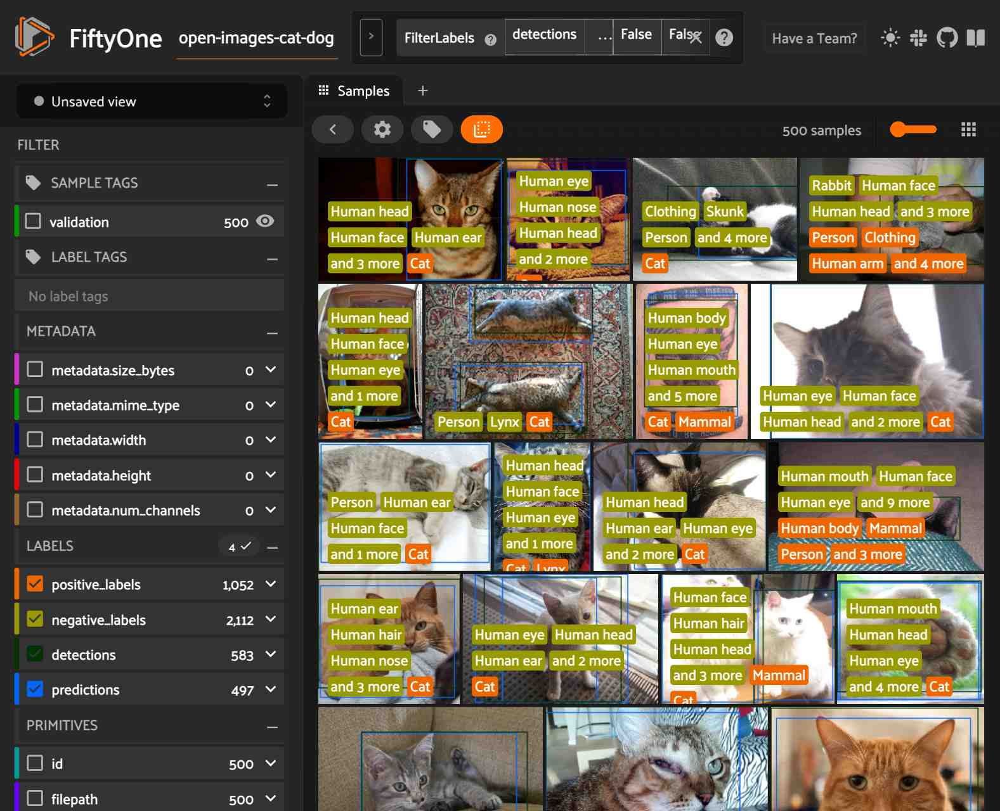

In [50]:
session.view = eval_view

Now let's perform the same evaluation for "Cat". The eval view contains the `type` scalar field which we can use to select only false positives. Then under `predictions`, we can select only "Cat" predictions and slide the confidence up to 0.9.

In [51]:
session.freeze()

### Visualize embeddings

FiftyOne is designed to make it easy to explore the labels and attributes that you [add to your datasets yourself](https://voxel51.com/docs/fiftyone/user_guide/using_datasets.html#adding-fields-to-a-sample). However, it can also provide much deeper insights.

For example, FiftyOne provides methods for [sample uniqueness](https://voxel51.com/docs/fiftyone/user_guide/brain.html#image-uniqueness), [label mistakes](https://voxel51.com/docs/fiftyone/user_guide/brain.html#label-mistakes), and [sample hardness](https://voxel51.com/docs/fiftyone/user_guide/brain.html#sample-hardness). It also provides support for automatically [generating and visualizing embeddings](https://voxel51.com/docs/fiftyone/user_guide/brain.html#visualizing-embeddings), which we'll use next.

The cell below uses [compute_visualization()](https://voxel51.com/docs/fiftyone/api/fiftyone.brain.html#fiftyone.brain.compute_visualization) to generate a 2D representation of the objects in the `predictions` field of our `eval_view` view.

Internally, the method generates deep embeddings for each object patch and then uses [UMAP](https://github.com/lmcinnes/umap) to generate the 2D representation.

In [52]:
import fiftyone.brain as fob

results = fob.compute_visualization(
    eval_view,
    patches_field="predictions",
    brain_key="eval_patches", # provide a brain key to save results to the dataset
    num_dims=2,
    method="umap",
    verbose=True,
    seed=51,
)

Computing patch embeddings...
 100% |█████████████████| 500/500 [1.4m elapsed, 0s remaining, 6.4 samples/s]      
Generating visualization...
UMAP(random_state=51, verbose=True)
Tue Feb 14 22:52:41 2023 Construct fuzzy simplicial set
Tue Feb 14 22:52:41 2023 Finding Nearest Neighbors
Tue Feb 14 22:52:41 2023 Finished Nearest Neighbor Search
Tue Feb 14 22:52:41 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Feb 14 22:52:42 2023 Finished embedding


First let's launch a new App instance for this exploration:


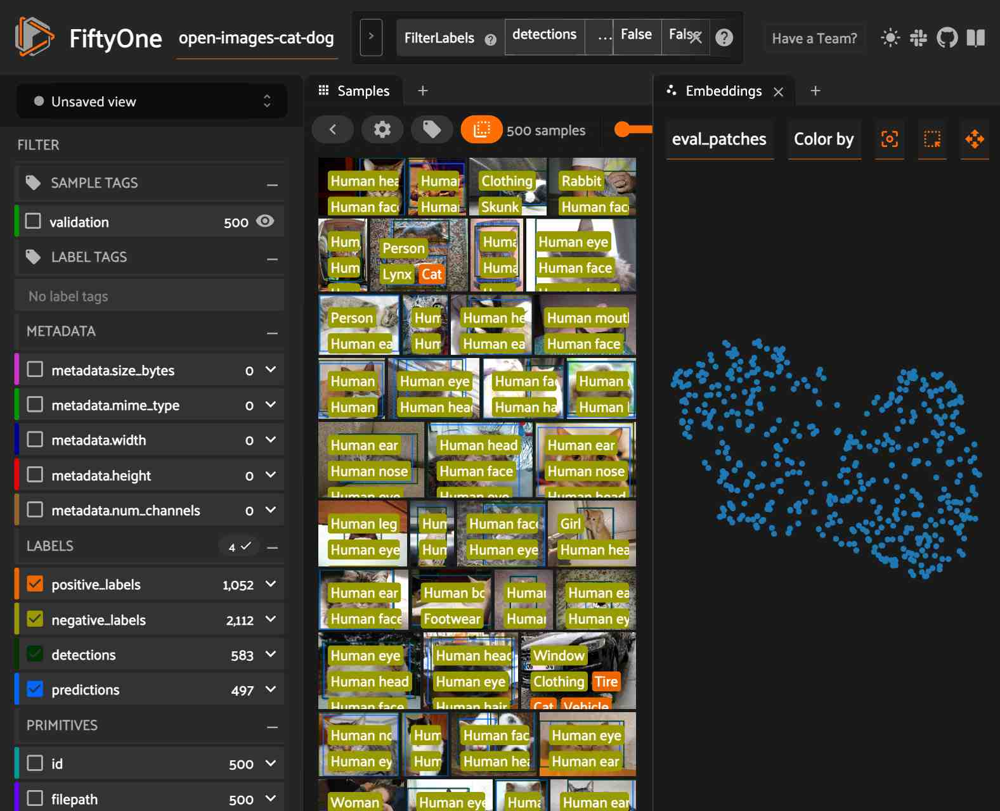

In [53]:
session.view=eval_view

Now let's visualize the object embeddings with each point colored by label and scaled by the size of the bounding box:

In [54]:
# Computes the area of each predicted object
bbox_area = F("bounding_box")[2] * F("bounding_box")[3]
areas = eval_view.values("predictions.detections[]", bbox_area)

plot = results.visualize(labels="predictions.detections.label", sizes=areas)
plot.show()

FigureWidget({
    'data': [{'customdata': array(['63ec56fed3964b0824a4dae9', '63ec570bd3964b0824a4daea',
    …

Executing took 0.165 seconds


**Note:** These plots are currently only interactive in Jupyter notebooks. A future release will provide interactive plots in all environments.

In [55]:
# If you are in a Jupyter notebook, attach plot to session
session.plots.attach(plot)

If you're working in a Jupyter notebook, click the lasso tool on the plot to select a region of points that you want to visualize in the App.

You can clearly see the cat detections delinated from the dog detections.

Now try hiding the "Dog" points by clicking on the corresponding legend entry in the upper right so that you see only the "Cat" points. You can then lasso the cluster of "Cat" points that reside in the "Dog" cluster. These points are the false positives that the model predicted as "Cat" but were in fact dogs!

This kind of visiualization can be invaluable for a multitude of reasons, particularly for a dataset like Open Images that contains machine-generated labels. Visualizing and interactively exploring embeddings lets you quickly spot check which labels may need to be reviewed by human annotators.

In [56]:
session.freeze()

### Sort by similarity

FiftyOne also supports sorting samples and objects by [visual similarity](https://voxel51.com/docs/fiftyone/user_guide/brain.html#brain-similarity).

To use this feature, we first use [compute_similarity()](https://voxel51.com/docs/fiftyone/api/fiftyone.brain.html#fiftyone.brain.compute_similarity) to index our dataset (the images, in this case):

In [57]:
import fiftyone.brain as fob

# Indexes the images in the dataset by visual similarity
fob.compute_similarity(dataset, brain_key="similarity")

Computing embeddings...
 100% |█████████████████| 500/500 [1.8m elapsed, 0s remaining, 4.3 samples/s]      


Under the hood, deep embeddings are again being used to generate the index. By default, a general purpose model packaged with FiftyOne is used, but you can also provide your own embeddings via the optional `embeddings` argument.

Once similarity has been computed, we can sort the samples in the dataset based on their similarity to selected sample(s) of interest. This can be done either (a) programmatically via the [sort_by_similarity()](https://voxel51.com/docs/fiftyone/api/fiftyone.core.collections.html#fiftyone.core.collections.SampleCollection.sort_by_similarity) view stage, or (b) in the App by clicking the [sort by similarity button](https://voxel51.com/docs/fiftyone/user_guide/app.html#sorting-by-visual-similarity) as shown below.


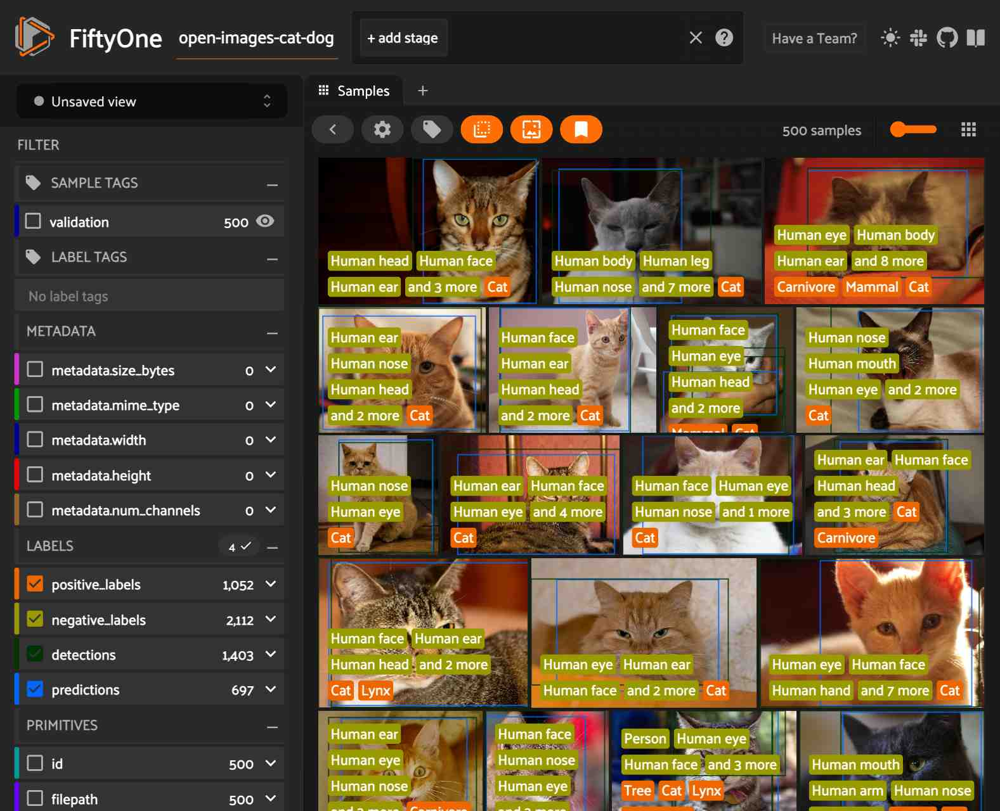

In [58]:
session.view = dataset.view()

In [59]:
session.freeze()

### Tagging

Interactive plots and embeddings can power valuable workflows like [semi-supervised annotation](https://voxel51.com/docs/fiftyone/tutorials/image_embeddings.html), [removing duplicates](https://nbviewer.jupyter.org/github/voxel51/fiftyone-examples/blob/master/examples/image_deduplication.ipynb), [detecting annotation mistakes](https://voxel51.com/docs/fiftyone/tutorials/detection_mistakes.html), and much more.

For example, Open Images contains a class for "Cattle". However, this class contains animals like cows, sheep, and goats. We can use FiftyOne to visualize clusters of embeddings for "Cattle" and use the App's [tagging feature](https://voxel51.com/docs/fiftyone/user_guide/app.html#tags-and-tagging) to assign fine-grained labels to each type of cattle, which will conveniently form clusters when visualized.

In [60]:
# Download some images that contain cattle from Open Images
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="test",
    label_types=["detections"],
    classes=["Cattle"],
    max_samples=200,
    seed=51,
    shuffle=True,
    dataset_name="open-images-cattle",
)

 100% |███████████████████| 200/200 [6.9s elapsed, 0s remaining, 28.7 files/s]       
Dataset info written to 'datasets/open-images-v7/info.json'
Loading 'open-images-v7' split 'test'
 100% |█████████████████| 200/200 [1.0s elapsed, 0s remaining, 199.2 samples/s]         
Dataset 'open-images-cattle' created


In [61]:
from fiftyone import ViewField as F

# Create a view that only contains cattle detections
cattle_view = dataset.filter_labels("ground_truth", F("label") == "Cattle")


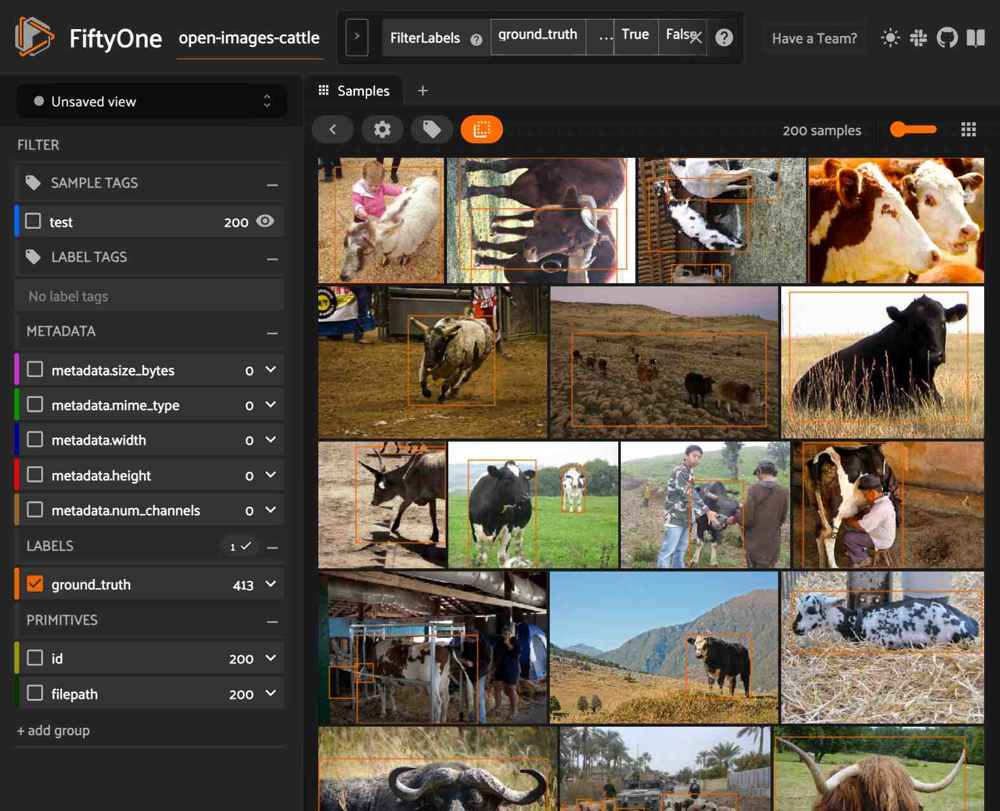

In [62]:
session.view=cattle_view

In [63]:
session.freeze()

In [64]:
import fiftyone.brain as fob

# Generate a 2D representation of the cattle objects
results = fob.compute_visualization(
    cattle_view,
    patches_field="ground_truth",
    num_dims=2,
    method="umap",
    verbose=True,
    seed=51,
)

Computing patch embeddings...
 100% |█████████████████| 200/200 [50.2s elapsed, 0s remaining, 4.4 samples/s]      
Generating visualization...
UMAP(random_state=51, verbose=True)
Tue Feb 14 23:01:46 2023 Construct fuzzy simplicial set
Tue Feb 14 23:01:46 2023 Finding Nearest Neighbors
Tue Feb 14 23:01:47 2023 Finished Nearest Neighbor Search
Tue Feb 14 23:01:47 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Tue Feb 14 23:01:47 2023 Finished embedding


In [65]:
import fiftyone.brain as fob

# Generate a 2D representation of the cattle objects
cattle_patches_view=cattle_view.to_patches(field="ground_truth")
patches_results = fob.compute_visualization(
    cattle_patches_view,
    patches_field="ground_truth",
    brain_key="cattle_patches_gt",
    num_dims=2,
    method="umap",
    verbose=True,
    seed=51,
)

Computing patch embeddings...
 100% |█████████████████| 413/413 [52.7s elapsed, 0s remaining, 9.2 samples/s]      
Generating visualization...
UMAP(random_state=51, verbose=True)
Wed Feb 15 00:33:37 2023 Construct fuzzy simplicial set
Wed Feb 15 00:33:37 2023 Finding Nearest Neighbors
Wed Feb 15 00:33:37 2023 Finished Nearest Neighbor Search
Wed Feb 15 00:33:37 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Wed Feb 15 00:33:38 2023 Finished embedding


In [66]:
patches_view=dataset.to_patches(field="ground_truth")
gt_patches_results = fob.compute_visualization(
    patches_view,
    patches_field="ground_truth",
    brain_key="patches_gt",
    num_dims=2,
    method="umap",
    verbose=True,
    seed=51,
)

Computing patch embeddings...
 100% |███████████████| 1696/1696 [3.3m elapsed, 0s remaining, 7.1 samples/s]      
Generating visualization...
UMAP(random_state=51, verbose=True)
Wed Feb 15 01:00:42 2023 Construct fuzzy simplicial set
Wed Feb 15 01:00:43 2023 Finding Nearest Neighbors
Wed Feb 15 01:00:43 2023 Finished Nearest Neighbor Search
Wed Feb 15 01:00:43 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Wed Feb 15 01:00:45 2023 Finished embedding


The snippet below visualizes the cattle instances that we downloaded in a 2D space, with each point scaled by the size of the bounding box:

In [67]:
# Computes the area of each cattle detection in the view
# Bounding box coordinates are in the format: [top-left-x, top-left-y, width, height]
bbox_area = F("bounding_box")[2] * F("bounding_box")[3]
areas = cattle_patches_view.values("ground_truth", bbox_area) #cattle_view.values("ground_truth.detections[]", bbox_area)


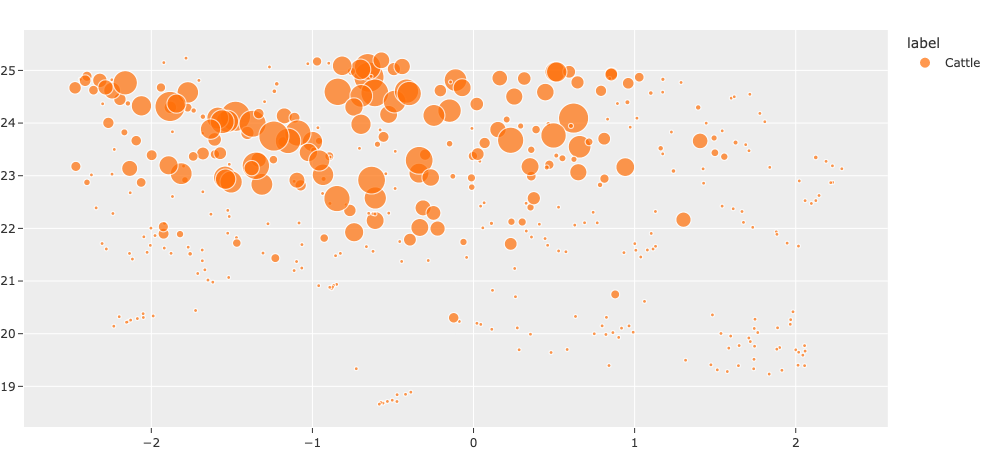

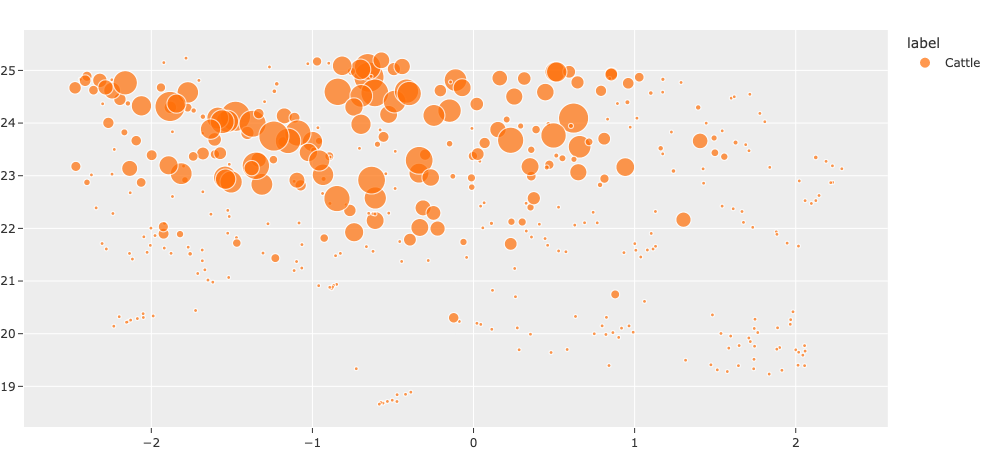

FigureWidget({
    'data': [{'customdata': array(['63ec8290d3964b0824a4f481', '63ec8290d3964b0824a4f485',
    …

Executing took 0.136 seconds


In [68]:
plot = patches_results.visualize(labels="ground_truth.label", sizes=areas)

**Note:** These plots are currently only interactive in Jupyter notebooks. A future release will provide interactive plots in all environments.


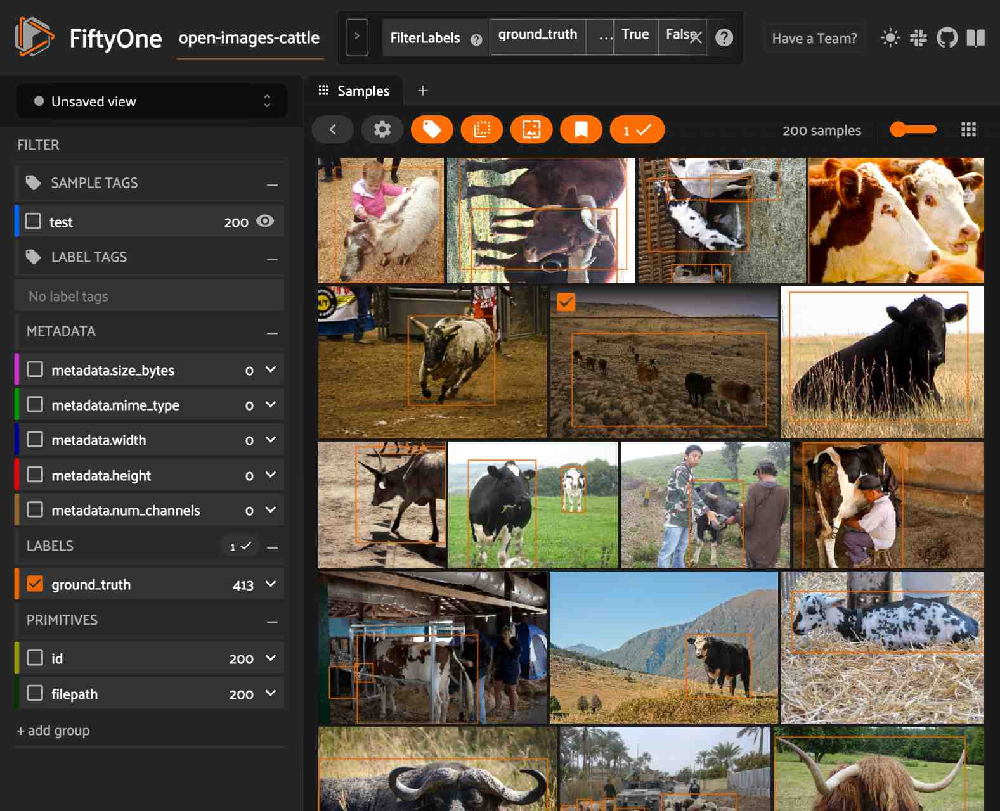

In [69]:
session = fo.launch_app(view=cattle_view)

In [70]:
# If you are in a Jupyter notebook, attach plot to session
session.plots.attach(plot)
plot.connect()

If you're working in a Jupyter notebook, click the lasso tool on the plot and then select a cluster of points so you can visualize them in the App. Once you have identified a set of samples that you [want to tag](https://voxel51.com/docs/fiftyone/user_guide/app.html#tags-and-tagging), select them and then click the tag icon in the App and assign an appropriate tag.

From here, you could, for example, [export the tagged subset](https://voxel51.com/docs/fiftyone/user_guide/export_datasets.html) and send to human annotators for verification and relabeling.

In [71]:
session.freeze()

## Summary

In this tutorial, we saw how to download, explore, and evaluate using Open Images. In particular, we covered:

* Downloading the [Open Images dataset](https://storage.googleapis.com/openimages/web/index.html) from the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/index.html)
* Computing predictions with a model from the [FiftyOne Model Zoo](https://voxel51.com/docs/fiftyone/user_guide/model_zoo/index.html)
* Using FiftyOne's native support for [Open Images evaluation](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#open-images-style-evaluation) to evaluate a model and compute its mAP
* Exploring the dataset and [evaluation results](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html)
* [Visualizing embeddings](https://voxel51.com/docs/fiftyone/user_guide/brain.html#visualizing-embeddings) through [interactive plots](https://voxel51.com/docs/fiftyone/user_guide/plots.html)

**So, what's the takeaway?**

Open Images is a massive and thoroughly labeled dataset that would make a useful addition to your data lake and model training workflows. And, the easiest way to download and explore Open Images is using FiftyOne!

With huge and diverse datasets like Open Images, hands-on evaluation of your model results can be difficult. FiftyOne makes it easy to understand your dataset, find failure modes in your model, and reveal hidden patterns in your data using techniques like embedding visualization.